Este Notebook está dedicado al proceso de interpolación de la nube de puntos.

In [1]:
import warnings
import os


import pandas as pd
import numpy as np


import cv2
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

from sklearn.cluster import KMeans


import glob
from mpl_toolkits.mplot3d import Axes3D

In [2]:
warnings.filterwarnings("ignore")

### Datos completos

In [ ]:
directory = 'ruta'
file_list = sorted(glob.glob(directory + '*.bin')) # List all .bin files in the directory
file_list

In [4]:
def read_velodyne_bin(path):
    """
    Lee un archivo .bin y lo convierte en un array de numpy

    Args:
    path: path del archivo .bin

    Returns:
    points (np.ndarray): array de numpy con los puntos del archivo .bin (n, 4)
    """
    points = np.fromfile(path, dtype=np.float32).reshape(-1, 4)
    return points

In [5]:
def process_directories(directories):
    """
    Procesa todos los archivos .bin en una lista de directorios.

    Args:
    directories (list): Lista de directorios a procesar.

    Returns:
    all_points (list): Lista de arrays de numpy con los puntos de todos los archivos.
    """
    all_points = []
    for directory in directories:
        # Lista de archivos .bin en el directorio
        file_list = sorted(glob.glob(directory + '*.bin'))
        # Extracción de los puntos de cada archivo
        for file in file_list:
            points = read_velodyne_bin(file)
            all_points.append(points)
    
    return all_points

# Lista de directorios a procesar
directories = [
    './data/synced/2011_09_26_drive_0001_sync/velodyne_points/data/',
    './data/synced/2011_09_26_drive_0002_sync/velodyne_points/data/',
    './data/synced/2011_09_26_drive_0005_sync/velodyne_points/data/',
    './data/synced/2011_09_26_drive_0009_sync/velodyne_points/data/',
    './data/synced/2011_09_26_drive_0011_sync/velodyne_points/data/',
    './data/synced/2011_09_26_drive_0013_sync/velodyne_points/data/',
    './data/synced/2011_09_26_drive_0017_sync/velodyne_points/data/'
]

In [7]:
points = process_directories(directories)

### Funciones de guardado de puntos

In [11]:
def save_to_bin(data, filename):
    """
    Guarda los datos LIDAR en un archivo .bin.

    Args:
    data (np.ndarray): Puntos LIDAR con columnas [X, Y, Z, Intensity].
    filename (str): Nombre del archivo .bin.
    """
    data.astype(np.float32).tofile(filename)

In [12]:
def save_reduced_points(reduced_points, output_dir='./reduced_data'):
    """
    Guarda los puntos LIDAR reducidos en archivos binarios con un patrón de nomenclatura especificado.

    Args:
    reduced_points (list of np.ndarray): Lista de puntos LIDAR reducidos.
    output_dir (str): Directorio donde fuardar los datos.
    """
    for i, points in enumerate(reduced_points):
        filename = f"{output_dir}/velodyne_{i:04d}.bin"
        save_to_bin(points, filename)

In [13]:
# save_reduced_points(reduced_points)

In [14]:
# directory = ['./complete_data/32_channels']
# points = process_directories(directory)

## Visualización

In [17]:
directories = ["./32_channels/"]

In [18]:
reduced_points = process_directories(directories)

In [19]:
def calculate_distance(x, y):
    return np.sqrt(x**2 + y**2)

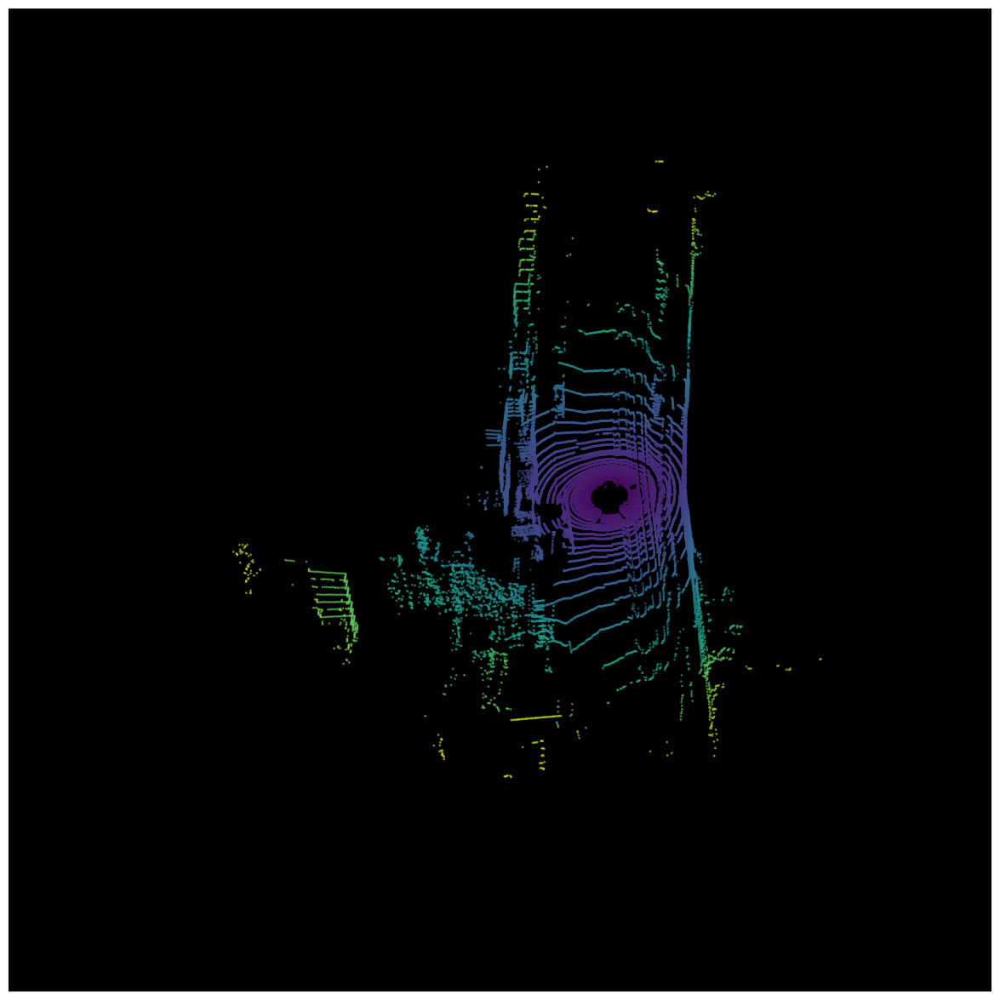

In [20]:
def picture_angle_visualization(points, frame, angle):
    '''
    Visualiza la nube de puntos de una instancia en un ángulo específicado

    Args:
        points (list): Lista de arrays de numpy con los puntos de todos los archivos.
        frame (int): Frame a visualizar.
        angle (int): Ángulo de visualización.

    Returns:
        imagen de la nube de puntos
    '''


    fig = plt.figure(figsize=(25, 15))
    ax = fig.add_subplot(111, projection='3d')
    point = points[frame]

    # Calcula la distancia entre los puntos y el origen para generar un mapa de profundidad (opcional si no se quiere usar el canal de intensidad o reflectividad)
    distances = calculate_distance(point[:, 0], point[:, 1])
    ax.scatter(point[:, 0], point[:, 1], point[:, 2], c=distances, cmap='viridis', s=1, alpha=0.5)
    ax.set_facecolor('black')
    ax.w_xaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
    ax.w_yaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
    ax.w_zaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
    ax.grid(False)
    ax.view_init(80, angle)
    # plt.show()

picture_angle_visualization(reduced_points,0, 175)

In [21]:
plotly_3d_scatter(points[0], 'LIDAR Data')

## Interpolation

In [24]:
directory = ['./32_channels/']
points = process_directories(directory)

In [26]:
vertical_angles = np.arctan2(points[0][:, 2], np.sqrt(points[0][:, 0]**2 + points[0][:, 1]**2))    # calculamos los ángulos verticales 
horizontal_angles = np.arctan2(points[0][:, 1], points[0][:, 0])    # calculamos los angulos horizontales

In [29]:
kmeans = KMeans(n_clusters=32)
labels = kmeans.fit_predict(vertical_angles.reshape(-1, 1)) # detectamos a que capa pertenece cada punto, sabiendo que hay 64 capas
centers = kmeans.cluster_centers_.flatten()


closest_centers_idx = np.argmin(np.abs(vertical_angles[:, np.newaxis] - centers), axis=1) # asignamos cada punto a la capa más cercana

In [32]:
fig = px.scatter_3d(
    x=points[0][:, 0],
    y=points[0][:, 1],
    z=points[0][:, 2],
    color=closest_centers_idx,
    title='LIDAR Data',
    labels={'x': 'X', 'y': 'Y', 'z': 'Z'}
)
fig.update_traces(marker=dict(size=1))
fig.update_layout(template='plotly_dark',
                paper_bgcolor='rgba(0,0,0,0)',
                scene=dict(
                    xaxis=dict(showgrid=False),
                    yaxis=dict(showgrid=False),
                    zaxis=dict(showgrid=False),
                    aspectmode='data'
                ))

fig.show()      # visualizamos los puntos agrupados en capas

In [33]:
sorted_centers_idx = np.argsort(centers) # se ordenan las capas por los angulos verticales

In [35]:
vertical_angles = np.arctan2(points[0][:, 2], np.sqrt(points[0][:, 0]**2 + points[0][:, 1]**2))
    
# Realiza un clustering de los ángulos para identificar capas distintas
kmeans = KMeans(n_clusters=32)
labels = kmeans.fit_predict(vertical_angles.reshape(-1, 1))
centers = kmeans.cluster_centers_.flatten()
    
# Ordenar los centros de las capas por el ángulo vertical
sorted_indices = np.argsort(centers)
sorted_centers = centers[sorted_indices]
    
# Reasignar las etiquetas según el orden de los centros ordenados
sorted_labels = np.zeros_like(labels)
for i, idx in enumerate(sorted_indices):
    sorted_labels[labels == idx] = i

### Prueba de interpolación lineal entre 2 puntos

In [43]:
def interpolate_between_layers(layer1, layer2):
    """
    Interpolación lineal entre dos capas de puntos.

    Args:
        layer1 (np.ndarray): Capa de puntos inferior.
        layer2 (np.ndarray): Capa de puntos superior.

    Returns:
        interpolated_layer (np.ndarray): Capa de puntos interpolada.
    """
    # Ensure both layers have the same number of points for interpolation
    min_len = min(len(layer1), len(layer2))
    layer1 = layer1[:min_len]
    layer2 = layer2[:min_len]
    
    # Perform linear interpolation between corresponding points in layer1 and layer2
    interpolated_layer = (layer1 + layer2) / 2
    return interpolated_layer

In [ ]:
def plotly_3d_scatter(points, name):
    """
    Visualiza una nube de puntos LIDAR en 3D con Plotly.

    Args:
        points (np.ndarray): Nubes de puntos, se esperan 4 campos [x, y, z, intensidad/reflectividad].
        name (str): Nombre de la visualización.

    Returns:
        fig (plotly figure): Figura de Plotly.
    """
    fig = px.scatter_3d(
        x=points[:, 0],
        y=points[:, 1],
        z=points[:, 2],
        color=points[:, 3],
        title=name,
        labels={'x': 'X', 'y': 'Y', 'z': 'Z'}
    )
    fig.update_traces(marker=dict(size=1))
    fig.update_layout(template='plotly_dark',
                      paper_bgcolor='rgba(0,0,0,0)',
                      scene=dict(
                          xaxis=dict(showgrid=False),
                          yaxis=dict(showgrid=False),
                          zaxis=dict(showgrid=False),
                          aspectmode='data'
                      ))
    return fig

Prueba individual

In [44]:
punto1 = points[0][closest_centers_idx == 0]
punto2 = points[0][closest_centers_idx == 1]

point = np.concatenate((punto1, punto2))

# hacemos interpolacion entre los dos puntos
point1_2 = interpolate_between_layers(punto1, punto2)

In [48]:
point = np.concatenate((punto1, point1_2, punto2))

plotly_3d_scatter(point, 'LIDAR Data')

In [49]:
# dibujamos la capa interpolada point1_2 de un color distinto para poder diferenciarla
import plotly.graph_objects as go
fig = go.Figure()

fig.add_trace(go.Scatter3d(
    x=punto1[:, 0],
    y=punto1[:, 1],
    z=punto1[:, 2],
    mode='markers',
    marker=dict(size=1, color='blue'),
    name='point1'
))

fig.add_trace(go.Scatter3d(
    x=punto2[:, 0],
    y=punto2[:, 1],
    z=punto2[:, 2],
    mode='markers',
    marker=dict(size=1, color='blue'),
    name='point2'
))

fig.add_trace(go.Scatter3d(
    x=point1_2[:, 0],
    y=point1_2[:, 1],
    z=point1_2[:, 2],
    mode='markers',
    marker=dict(size=1, color='red'),
    name='point1_2'
))

fig.update_layout(
    title='LIDAR Data',
    # template='plotly_dark',
    paper_bgcolor='rgba(0,0,0,0)',
    scene=dict(
        xaxis=dict(title='X', showgrid=False),
        yaxis=dict(title='Y', showgrid=False),
        zaxis=dict(title='Z', showgrid=False),
        aspectmode='data'
    )
)

fig.show()

### Linear interpolation

In [55]:
def interpolate_layers(points, layers=32):
    """
    Realiza interpolación entre capas de puntos LIDAR.

    Args:
        points (np.ndarray): LIDAR dataset.
        layers (int): Numero de capas a interpolar, por defecto 32.

    Returns:
        original_points (np.ndarray): Puntos originales de cada capa.
        interpolated_points (np.ndarray): Puntos interpolados entre capas.
    """

    vertical_angles = np.arctan2(points[:, 2], np.sqrt(points[:, 0]**2 + points[:, 1]**2))   # Calcula los ángulos verticales de los puntos
    
    kmeans = KMeans(n_clusters=layers)   # Clúster de los ángulos para identificar capas distintas
    labels = kmeans.fit_predict(vertical_angles.reshape(-1, 1))
    centers = kmeans.cluster_centers_.flatten()
    
    sorted_indices = np.argsort(centers)    # Ordena los centroides de las capas por el ángulo vertical
    sorted_centers = centers[sorted_indices]
    

    sorted_labels = np.zeros_like(labels)  # Reasigna las etiquetas según el orden de los centros ordenados
    for i, idx in enumerate(sorted_indices):
        sorted_labels[labels == idx] = i
    

    interpolated_points = []
    original_points = []
    for i in range(layers - 1): 
        # Selecciona los puntos de la capa actual y la siguiente
        current_layer = points[sorted_labels == i]
        next_layer = points[sorted_labels == i + 1]
        
        
        interpolated_layer = interpolate_between_layers(current_layer, next_layer)
        
        original_points.append(current_layer)
        interpolated_points.append(interpolated_layer)
    
    # Añade los puntos de las capas interpoladas
    last_layer = points[sorted_labels == layers - 1]
    last_layer = last_layer[np.argsort(last_layer[:, 0])]
    original_points.append(last_layer)
    
    return np.vstack(original_points), np.vstack(interpolated_points)


In [56]:
interpolated_points = interpolate_layers(points[0])

In [ ]:
fig = px.scatter_3d(
x=interpolated_points[:, 0],
y=interpolated_points[:, 1],
z=interpolated_points[:, 2],
color=interpolated_points[:, 3],
title='LIDAR Data',
labels={'x': 'X', 'y': 'Y', 'z': 'Z'}
)

fig.update_traces(marker=dict(size=1))
fig.update_layout(template='plotly_dark',
paper_bgcolor='rgba(0,0,0,0)',
scene=dict(
xaxis=dict(showgrid=False),
yaxis=dict(showgrid=False),
zaxis=dict(showgrid=False),
aspectmode='data'
))

fig.show()

In [ ]:
fig = go.Figure()

# Puntos originales
fig.add_trace(go.Scatter3d(
    x=interpolated_points[0][:, 0],
    y=interpolated_points[0][:, 1],
    z=interpolated_points[0][:, 2],
    mode='markers',
    marker=dict(
        size=1,
        color='blue',
        opacity=0.8
    ),
    name='Original Points'
))

# Puntos interpolados
fig.add_trace(go.Scatter3d(
    x=interpolated_points[1][:, 0],
    y=interpolated_points[1][:, 1],
    z=interpolated_points[1][:, 2],
    mode='markers',
    marker=dict(
        size=1,
        color='red',
        opacity=0.8
    ),
    name='Interpolated Points'
))


fig.update_layout(
    title='LIDAR Data',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
        zaxis=dict(showgrid=False),
        aspectmode='data'
    ),
    template='plotly_dark',
    paper_bgcolor='rgba(0,0,0,0)'
)

fig.show()

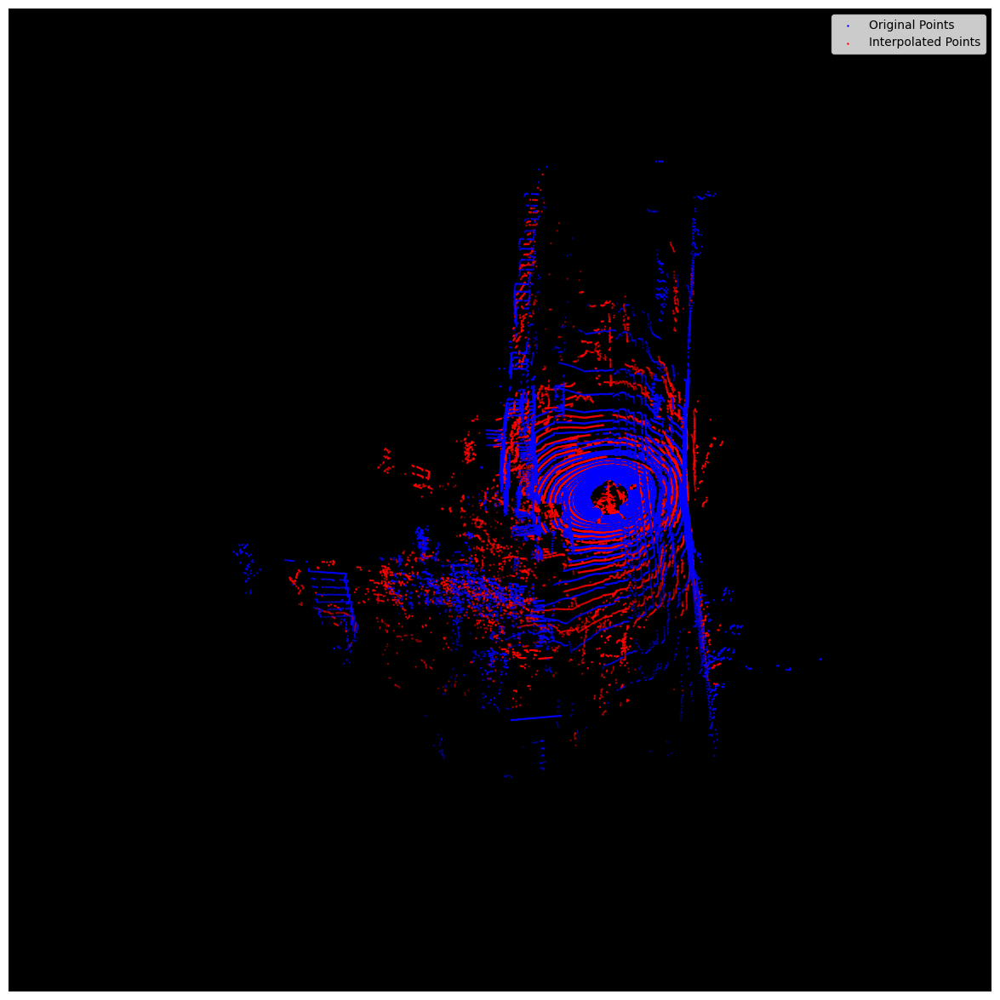

In [ ]:
def calculate_distance(x, y):
    return np.sqrt(x**2 + y**2)

fig = plt.figure(figsize=(25, 15))
ax = fig.add_subplot(111, projection='3d')

# Puntos originales en azul
distances_original = calculate_distance(interpolated_points[0][:, 0], interpolated_points[0][:, 1])
ax.scatter(interpolated_points[0][:, 0], interpolated_points[0][:, 1], interpolated_points[0][:, 2], c='blue', s=0.5, label='Original Points')

# Puntos interpolados en rojo
distances_interpolated = calculate_distance(interpolated_points[1][:, 0], interpolated_points[1][:, 1])
ax.scatter(interpolated_points[1][:, 0], interpolated_points[1][:, 1], interpolated_points[1][:, 2], c='red', s=0.5, label='Interpolated Points')

ax.set_facecolor('black')
ax.w_xaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax.w_yaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax.w_zaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax.grid(False)
ax.view_init(80, 175)
ax.legend()

plt.show()

In [ ]:
interpolated_points = [interpolate_layers(point) for point in points] # realizamos el mismo proceso para todos los puntos y los guardamos en un archivo binario

In [148]:
def save_interpolated_points(interpolated_points, output_dir='ruta_salida'):
    """
    Guarda los puntos LIDAR interpolados en archivos binarios con un patrón de nomenclatura especificado.

    Args:
    interpolated_points (list of np.ndarray): Lista de puntos LIDAR interpolados.
    output_dir (str): Directorio donde fuardar los datos.
    """
    for i, points in enumerate(interpolated_points):
        filename = f"{output_dir}/velodyne_{i:04d}.bin"
        save_to_bin(points, filename)

save_interpolated_points(interpolated_points)